<a href="https://colab.research.google.com/github/rociolozanocaro/p3-rociolozanocaro/blob/main/p3_rociolozanocaro_consultas_sql.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. The dataset



This dataset was previously cleaned (and joined) in SQL from Sakila database. It has information about the customer like the first and last name, the address among others. It also has information about the dates of rental and return and the amount.

#2. Libraries

In [49]:
import pandas as pd # For data manipulation
import numpy as np # For numeric calculations
import plotly as pl # For interactive visualization
import seaborn as sns # For statistic visualization
import missingno as msno # For null values visualization
import matplotlib.pyplot as plt # For data visualization
import geopandas as gpd # For geodata visualization


In [48]:
%%capture
!pip install geodatasets #for the choropleth map

In [77]:
import geopandas as gpd
import geodatasets
import os
import requests
import zipfile
import folium

# 3. General visualization

In [51]:
#The dataset is loaded.
df = pd.read_csv('view_activity.csv')
df.head()

,customer_id,first_name,last_name,email,active,address,district,postal_code,city,country,rental_date,return_date,amount,payment_date,rental_duration
0,38,martha,gonzalez,martha.gonzalez@sakilacustomer.org,1,269 cam ranh parkway,chisinau,34689,chisinau,moldova,2005-06-20 10:00:51,2005-06-22 06:28:51,4.99,2005-06-20 10:00:51,2
1,113,cindy,fisher,cindy.fisher@sakilacustomer.org,1,1079 tel aviv-jaffa boulevard,sucre,10885,cumaná,venezuela,2005-06-20 10:04:36,2005-06-23 07:38:36,0.99,2005-06-20 10:04:36,3
2,598,wade,delvalle,wade.delvalle@sakilacustomer.org,1,1331 usak boulevard,vaud,61960,lausanne,switzerland,2005-06-20 10:10:29,2005-06-28 15:48:29,2.99,2005-06-20 10:10:29,8
3,133,pauline,henry,pauline.henry@sakilacustomer.org,1,261 saint louis way,coahuila de zaragoza,83401,torreón,mexico,2005-06-20 10:10:29,2005-06-22 07:26:29,0.99,2005-06-20 10:10:29,2
4,7,maria,miller,maria.miller@sakilacustomer.org,1,900 santiago de compostela parkway,central serbia,93896,kragujevac,yugoslavia,2005-06-20 10:11:53,2005-06-25 04:51:53,0.99,2005-06-20 10:11:53,5


In [52]:
#We make sure the cleaning is correct and there is no mistakes.
df.count()

,0
customer_id,1000
first_name,1000
last_name,1000
email,1000
active,1000
address,1000
district,996
postal_code,1000
city,1000
country,1000


In [53]:
#We look for duplicates
duplicados = df[df.duplicated()]
duplicados.count()

,0
customer_id,0
first_name,0
last_name,0
email,0
active,0
address,0
district,0
postal_code,0
city,0
country,0


In [54]:
# We make a copy.
view_activity_copy = df.copy()

In [55]:
#We make neccesary changes like drop null values.
view_activity_copy = view_activity_copy.dropna()

In [56]:
#We change datatype if neccesary.
view_activity_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 996 entries, 0 to 999
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   customer_id      996 non-null    int64  
 1   first_name       996 non-null    object 
 2   last_name        996 non-null    object 
 3   email            996 non-null    object 
 4   active           996 non-null    int64  
 5   address          996 non-null    object 
 6   district         996 non-null    object 
 7   postal_code      996 non-null    int64  
 8   city             996 non-null    object 
 9   country          996 non-null    object 
 10  rental_date      996 non-null    object 
 11  return_date      996 non-null    object 
 12  amount           996 non-null    float64
 13  payment_date     996 non-null    object 
 14  rental_duration  996 non-null    int64  
dtypes: float64(1), int64(4), object(10)
memory usage: 124.5+ KB


In [57]:
#Rental_date, return_date, payment_date are changed to date instead of object.
view_activity_copy['rental_date'] = view_activity_copy['rental_date'].apply(pd.to_datetime)
view_activity_copy['return_date'] = view_activity_copy['return_date'].apply(pd.to_datetime)
view_activity_copy['payment_date'] = view_activity_copy['payment_date'].apply(pd.to_datetime)

#First_name, last_name, email, address, district, city and country are changed to string.
view_activity_copy['first_name'] = view_activity_copy['first_name'].astype("string")
view_activity_copy['last_name'] = view_activity_copy['last_name'].astype("string")
view_activity_copy['email'] = view_activity_copy['email'].astype("string")
view_activity_copy['address'] = view_activity_copy['address'].astype("string")
view_activity_copy['district'] = view_activity_copy['district'].astype("string")
view_activity_copy['city'] = view_activity_copy['city'].astype("string")
view_activity_copy['country'] = view_activity_copy['country'].astype("string")
#We make sure the changes are made.
view_activity_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 996 entries, 0 to 999
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   customer_id      996 non-null    int64         
 1   first_name       996 non-null    string        
 2   last_name        996 non-null    string        
 3   email            996 non-null    string        
 4   active           996 non-null    int64         
 5   address          996 non-null    string        
 6   district         996 non-null    string        
 7   postal_code      996 non-null    int64         
 8   city             996 non-null    string        
 9   country          996 non-null    string        
 10  rental_date      996 non-null    datetime64[ns]
 11  return_date      996 non-null    datetime64[ns]
 12  amount           996 non-null    float64       
 13  payment_date     996 non-null    datetime64[ns]
 14  rental_duration  996 non-null    int64         

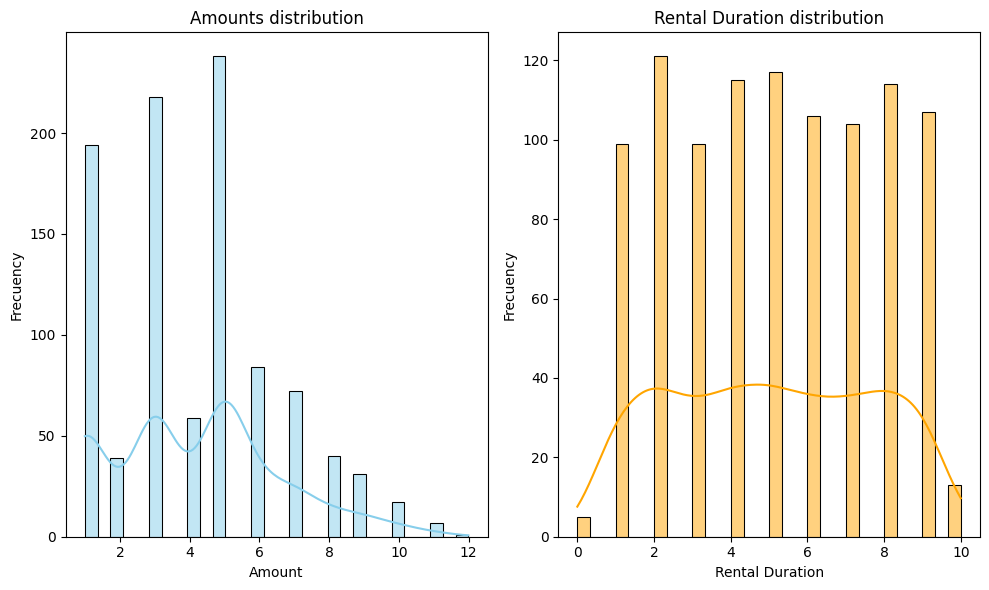

In [58]:
#We make a graphic to see different distributions.
flig, axes = plt.subplots(1,2, figsize=(10, 6))

sns.histplot(df['amount'], bins=30, kde=True, color='skyblue',ax=axes[0])
axes[0].set_title('Amounts distribution')
axes[0].set_xlabel('Amount')
axes[0].set_ylabel('Frecuency')

sns.histplot(df['rental_duration'], bins=30, kde=True, color='orange',ax=axes[1])
axes[1].set_title('Rental Duration distribution')
axes[1].set_xlabel('Rental Duration')
axes[1].set_ylabel('Frecuency')



plt.tight_layout()
plt.show()

In [84]:
#We make a Choropleth map.

world = gpd.read_file("ne_110m_admin_0_countries.shp")


<Figure size 2000x2000 with 0 Axes>

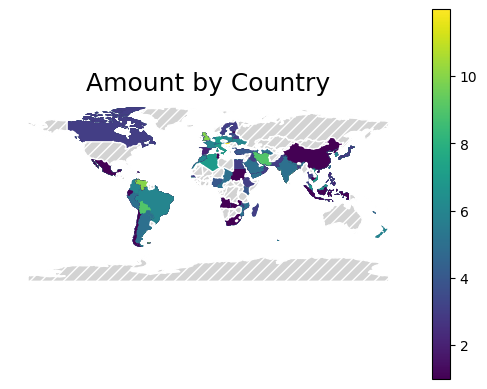

In [76]:
plt.figure(figsize=(20,20))
world_merged.plot(
    column="amount",
    cmap="viridis",
    legend=True,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "white",
        "hatch": "///",
        "label": "No Data"
    }
)

plt.title("Amount by Country", fontsize=18)
plt.axis("off")
plt.show()

In [83]:
#We make the map interactive.
m = folium.Map()
folium.GeoJson(world_merged,style_function=lambda feature:{'fillColor':'#gray' if feature['properties']['amount'] is None else '#3186cc','color':'black','weight':0.5,'fillOpacity':0.6},tooltip=folium.GeoJsonTooltip(fields=['NAME','amount'],aliases=['Country','Amount:'],localize=True,sticky=True)).add_to(m)
m

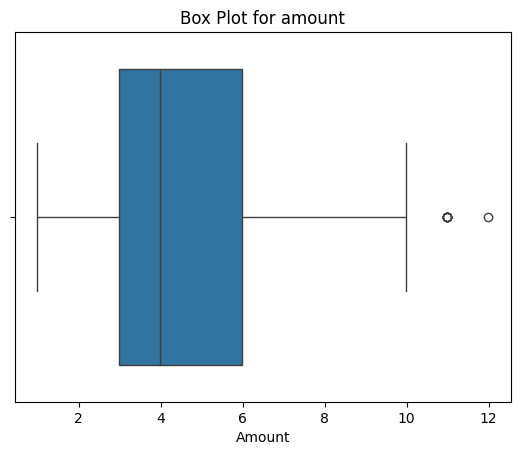

In [85]:
#A boxplot to look for outliers.
#Q1 and Q3
Q1 = df['amount'].quantile(0.25)
Q3 = df['amount'].quantile(0.75)

# RIC
RIC = Q3 - Q1

# Limits
lower_bound = Q1 - 1.5 * RIC
upper_bound = Q3 + 1.5 * RIC

#boxplot
sns.boxplot(x=view_activity_copy['amount'])
plt.title('Box Plot for amount')
plt.xlabel('Amount')
plt.show()

Right now, we want to know if there are any outliers if we divide the amount into different groups.

In [91]:
#We divide the amount into different categories
#First, we get the max and min value
min_val = df['amount'].min()
max_val = df['amount'].max()


#We define limits
bins = [
    min_val, #min
    3,
    5,
    10,
    max_val #max
]

labels =['micro','small', 'medium','large']

# Apply pd.cut to the original numerical 'amount' column, then assign to view_activity_copy
view_activity_copy['amount'] = pd.cut(df['amount'], bins=bins, labels=labels, right=False)



print(view_activity_copy['amount'].value_counts())
print("Min:", min_val, "Max:", max_val)

amount
micro     447
small     297
medium    244
large       7
Name: count, dtype: int64
Min: 0.99 Max: 11.99


In [95]:
#We count how many are in each category
categories = ["micro", "small", "medium", "large"]

for cat in categories:
  df_cat_filtered = view_activity_copy[view_activity_copy["amount"] == cat]

  if df_cat_filtered.empty:
    print(f"\nCategoría: {cat} (sin datos)")
    continue

  # Use the index of the filtered DataFrame to get the original numerical 'amount' from 'df'
  numerical_amounts_for_category = df.loc[df_cat_filtered.index, 'amount']

  q1 = numerical_amounts_for_category.quantile(0.25)
  q3 = numerical_amounts_for_category.quantile(0.75)
  iqr = q3-q1

  #Límites para detectar outliers
  lower_bound = q1 -1.5*iqr
  upper_bound = q3 + 1.5*iqr

  #Filtrar outliers based on the original numerical amounts for the category
  outliers = numerical_amounts_for_category[(numerical_amounts_for_category < lower_bound) | (numerical_amounts_for_category > upper_bound)]
  n_outliers=len(outliers)

  print(f"\nCategoría: {cat}")
  print(f" Q1: {q1}")
  print(f" Q3: {q3}")
  print(f" IQR: {iqr}")
  print(f" Outliers: {n_outliers}")


Categoría: micro
 Q1: 0.99
 Q3: 2.99
 IQR: 2.0
 Outliers: 0

Categoría: small
 Q1: 4.99
 Q3: 4.99
 IQR: 0.0
 Outliers: 59

Categoría: medium
 Q1: 5.99
 Q3: 7.99
 IQR: 2.0
 Outliers: 0

Categoría: large
 Q1: 10.99
 Q3: 10.99
 IQR: 0.0
 Outliers: 0


/tmp/ipython-input-449649301.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=view_activity_copy, x="amount", y="original_numerical_amount", palette="Set2")


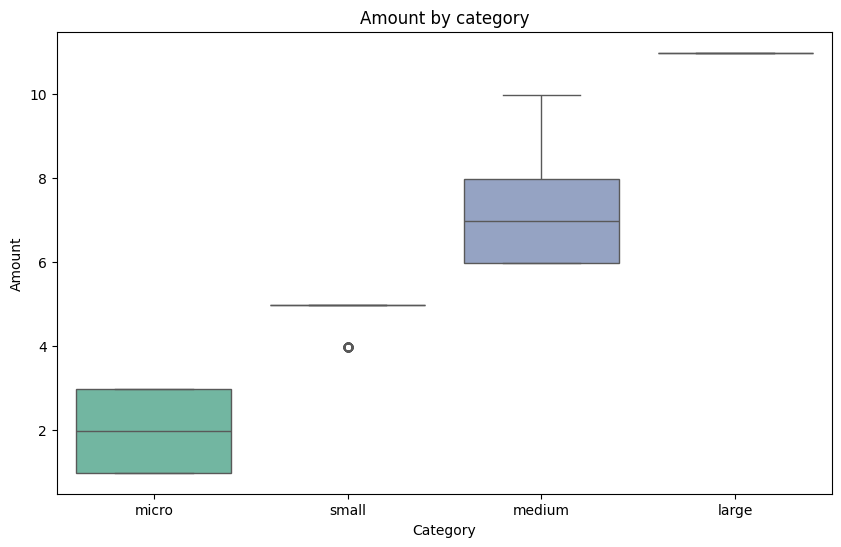

In [99]:
#New column to view_activity_copy with the amounts
view_activity_copy['original_numerical_amount'] = df.loc[view_activity_copy.index, 'amount']

plt.figure(figsize=(10, 6))
sns.boxplot(data=view_activity_copy, x="amount", y="original_numerical_amount", palette="Set2")
plt.title("Amount by category")
plt.xlabel("Category")
plt.ylabel("Amount")
plt.show()

#CONCLUSIONS
- The amount distribution is more irregular than the rental duration distribution.
- If we look for outliers in the column category there are only 2 outliers.
- If we look for outliers doing categories there are more outliers in one group. It means those two outliers could mean something and should be looked into detail.
- The big amount of outliers in one group could be caused of how the categories are divided. A change should be considered.

#4. We save the csv file.


In [101]:
view_activity_copy.to_csv("view_activity_clean.csv")